# Reference

- Finance Data Reader : https://github.com/FinanceData/FinanceDataReader
- 코스피 200 인덱스 설명 : https://namu.wiki/w/KOSPI200
- ETF 설명 : https://md2biz.tistory.com/8
-http://files.thinkpool.com/files/bbs/2017/11/12/%EC%BD%94%EC%8A%A4%ED%94%BC200%2B%EC%A7%80%EC%88%98%EC%82%B0%EC%B6%9C%EB%B0%A9%EB%B2%95.pdf : 코스피 200 지수산출방법
- https://elevenbuilding.tistory.com/entry/%EC%A3%BC%EC%8B%9D-%EA%B0%9C%EC%9E%A5-%ED%8F%90%EC%9E%A5-%EC%8B%9C%EA%B0%84%EA%B3%BC-%EA%B0%9C%EC%9E%A5%EC%9D%BC-%ED%9C%B4%EC%9E%A5%EC%9D%BC%ED%95%9C%EA%B5%AD-%EC%B4%9D%EC%A0%95%EB%A6%AC : 주식 개장 폐장 시간 및 휴장일(한국)

- https://m.blog.naver.com/PostView.nhn?blogId=phoonie&logNo=220265441337&proxyReferer=https%3A%2F%2Fwww.google.com%2F : Market Capitalization(Market Cap) vs Enterprise Value(EV)

- https://pdfs.semanticscholar.org/8bbc/6b03515a9f7de2464897f0bc10a7cd0b8347.pdf : State-of-the-Art in Stock Prediction Techniques

- https://www.spcforexcel.com/knowledge/basic-statistics/are-skewness-and-kurtosis-useful-statistics : Skewness and kurtosis

- https://medium.com/better-programming/exponential-smoothing-methods-for-time-series-forecasting-d571005cdf80 : Exponential smoothing methods

# Import Library

In [1]:
#!pip install FinanceDataReader
import FinanceDataReader as fdr
import pandas as pd
import numpy as np
import datetime
from itertools import repeat
from collections import Counter
import warnings
warnings.filterwarnings("ignore")

import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.gofplots import qqplot
from scipy.stats import kurtosis, skew
from sympy import Symbol,solve

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from sklearn.metrics import pairwise_distances_argmin
import matplotlib.pyplot as plt
import matplotlib
%matplotlib inline
matplotlib.rcParams['axes.unicode_minus'] = False # 마이너스 기호도 표시

from matplotlib import font_manager, rc
## 한글 깨짐 방지 목적 
font_name = font_manager.FontProperties(fname = 'c:/Windows/Fonts/malgun.ttf').get_name()
rc('font',family = font_name)

## For Mac
# rc('font', family='/Library/Fonts/AppleGothic.ttf')

import seaborn as sns
#!pip install plotly
import plotly
import plotly.plotly as py
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)

# Import data

- Train set : 2014.10.01 ~ 2018.09.30
- test set : 2018.10.01 ~ 2019.09.30 

2014.10.01부터 현재 시점까지의 코스피 지수를 살펴보면 다음을 발견할 수 있다.
- 2016.12~2018년 초까지 약간의 변동과 함께 지수가 증가함을 확인할 수 있다.
- 2018년 상반기 이후 변동과 함께 감소하는 추세를 발견할 수 있다.
- 추세에 관한 변화의 강도가 선형적이지 않다. --> Choose Multiplicative model

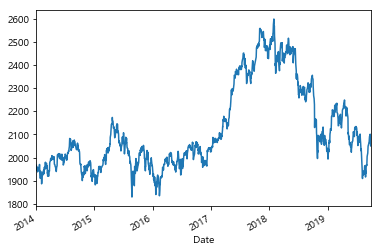

In [2]:
kospi = fdr.DataReader('KS11', '2014-01-01','2019-09-30')
kospi['Close'].plot()

Plotly를 통해 금융 데이터를 동적으로 시각화할 수 있다.

In [3]:
t_d = go.Scatter(x=kospi.index,y=kospi['Close'])
layout = go.Layout(title = 'Kospi plot', 
                   xaxis = dict(title = 'Date'),
                   yaxis = dict(title = 'Close'))

fig = go.Figure(data = [t_d],layout = layout)
iplot(fig)

한국 시장의 ETF는 445개가 존재함을 확인할 수 있다.
- 대표적 ETF
    - KODEX 200 INDEX(BY 삼성증권)   

In [4]:
df_etf = fdr.EtfListing('KR')
print(len(df_etf))

445


In [5]:
df_etf

,Symbol,Name
0,069500,KODEX 200
1,102110,TIGER 200
2,122630,KODEX 레버리지
3,153130,KODEX 단기채권
4,273130,KODEX 종합채권(AA-이상)액티브
5,148020,KBSTAR 200
6,278530,KODEX 200TR
7,233740,KODEX 코스닥150 레버리지
8,157450,TIGER 단기통안채
9,315930,KODEX Top5PlusTR


코스피 종목에 속한 회사를 살펴보면 다음과 같다
- 2019.10월 기준 794개 주식회사가 존재
- KOSPI 200 INDEX 종목은 매년 6월말에 바뀌므로, 시점에 따라 Trainset과 Testset에 속한 KOSPI 200 INDEX 종목 구성이 단일하지 않다.

In [6]:
df_krx = fdr.StockListing('KRX') 
print('전체 종목 갯수 in 한국 : {}'.format(len(df_krx)))
df_spx = fdr.StockListing('KOSPI') # Columns = {'Symbol','Name','Sector','Industry'}
print('전체 코스피 종목 갯수 : {}'.format(len(df_spx)))

전체 종목 갯수 in 한국 : 2326
전체 코스피 종목 갯수 : 795


코스피 Sector 분류 갯수 : 127 </bs>

코스피 Industry 분류 갯수 : 741

In [7]:
sec_df = pd.DataFrame(df_spx['Sector'].value_counts())
print('코스피 Sector 분류 갯수 : {}'.format(len(sec_df)))
ind_df = pd.DataFrame(df_spx['Industry'].value_counts())
print('코스피 Industry 분류 갯수 : {}'.format(len(ind_df)))

코스피 Sector 분류 갯수 : 127
코스피 Industry 분류 갯수 : 742


'삼성전자'의 일별주식가
- 삼성전자는 '2014-01-01'~'2019-09-30'까지 코스피 200 Index 종목에서 빠진적이 없는 우량기업이다.
- 주식시장이 개장되지 않은 날을 제외하였을 때 '2014-01-01'~'2019-09-30'까지 총 1410일 관측치가 존재 

In [8]:
samsung = fdr.DataReader(df_spx[df_spx['Name'].isin(['삼성전자'])]['Symbol'].values[0],'2014-01-01','2019-09-30')
samsung

,Open,High,Low,Close,Volume,Change
Date,,,,,,
2014-01-02,26960,27100,26040,26180,620500,-0.045918
2014-01-03,26000,26220,25740,25920,529932,-0.009931
2014-01-06,26060,26399,25920,26140,394716,0.008488
2014-01-07,26000,26360,25900,26080,395264,-0.002295
2014-01-08,26000,26080,25740,25820,409493,-0.009969
2014-01-09,26140,26140,25500,25500,425019,-0.012393
2014-01-10,25500,25720,25440,25440,363783,-0.002353
2014-01-13,25660,25940,25460,25900,328987,0.018082
2014-01-14,25940,26600,25800,26260,294333,0.013900


In [9]:
def take_data(df,start,end):
    new_df = []
#     convert_start = datetime.datetime.strptime(start,'%Y-%m-%d').date()
#     convert_end = datetime.datetime.strptime(end,'%Y-%m-%d').date()
#     l = (convert_start - convert_end).days()
    
    for i in range(len(df)):
        n = fdr.DataReader(df['Symbol'].values[i],start,end)
        
#         if len(n) == l:
#             n['breakaway'] = 'Yes' 
#         else:
#             n['breakaway'] = 'No'
        
        n['Symbol'] = df['Symbol'].values[i]
        n['Name'] = df['Name'].values[i]
        new_df.append(n)
    return pd.concat(new_df)

In [10]:
train = take_data(df_spx,'2014-01-01','2018-09-30')

In [11]:
test =  take_data(df_spx,'2018-10-01','2019-09-30')

2018.10월 이후 KOSPI에 새로 편입한 회사는 다음과 같다
    - '드림텍', '세아제강', '아시아나IDT', '에어부산', '우리금융지주', '하나제약', '현대오토에버'

In [12]:
print(len(np.unique(train['Symbol'])))
print(len(np.unique(test['Symbol'])))
print(np.unique(test[-(test['Symbol'].isin(train['Symbol']))]['Name']))

783
790
['드림텍' '세아제강' '아시아나IDT' '에어부산' '우리금융지주' '하나제약' '현대오토에버']


comp : 매월 기준 kospi200의 구성종목과 구성종목의 특성을 반영한 테이블</bs>

- comp의 주요 features
    - chg%	
    - mkt_cap(100m) : 시가 총액(유통주식수 * 주식가격)
    - mkt_weight 
    - trade_weight 	
    - mkt_cap_chg2_weight 	
    - turnover(100m) 
    - mkt_cap_chg 
    - mkt_cap_chg2 

In [13]:
comp = pd.read_excel('kospi200_구성종목_주가_시가총액등/kospi200_pdf_comp_20140101_20190931.xlsx')
comp = comp.iloc[:,1:]
weight = pd.read_excel('kospi200_구성종목_주가_시가총액등/kospi200_pdf_mkt_cap_201401_201909.xlsx')
cap = pd.read_excel('kospi200_구성종목_주가_시가총액등/kospi200_pdf_mkt_weight_201401_201909.xlsx')

코스피200의 구성종목이 200개가 아닌 16시점들이 존재한다. {201,202}

In [14]:
comp_len = pd.DataFrame(comp.groupby(['date']).size())
comp_len = comp_len.rename(columns = {0:'length'})
comp_len[comp_len['length'] != 200]

,length
date,
2017-07-31,201
2017-08-31,201
2018-01-31,201
2018-02-28,201
2018-03-30,201
2018-04-30,201
2018-05-31,201
2018-06-29,201
2018-07-31,202


코스피 200을 구성하는 종목명의 중복이 없음이 확인된다.

In [15]:
print(len(comp_len[comp_len['length'] != 200]))
print(sum(comp.groupby(['date'])['code'].size() > 200))

16
16


변수 'mkt_weight'와 'trade_weight'는 코스피 200을 구성하는 종목들의 가중치며 매 시점의 이상치는 존재하지 않음을 알 수 있다.

In [16]:
comp.groupby(['date'])['mkt_weight','trade_weight'].sum()

,mkt_weight,trade_weight
date,,
2014-01-02,100.0,100.0
2014-01-29,100.0,100.0
2014-02-28,100.0,100.0
2014-03-31,100.0,100.0
2014-04-30,100.0,100.0
2014-05-30,100.0,100.0
2014-06-30,100.0,100.0
2014-07-31,100.0,100.0
2014-08-29,100.0,100.0


In [17]:
train.head()

,Open,High,Low,Close,Volume,Change,Symbol,Name
Date,,,,,,,,
2014-01-02,3870,3960,3715,3785,21722,-0.021964,155660,DSR
2014-01-03,3770,3830,3745,3785,1490,0.000000,155660,DSR
2014-01-06,3785,3785,3700,3770,8080,-0.003963,155660,DSR
2014-01-07,3850,3850,3705,3705,3079,-0.017241,155660,DSR
2014-01-08,3715,3725,3670,3710,16460,0.001350,155660,DSR


## 시간 정보를 생성한다.

In [18]:
def add_time_features(data1,data2): # [train,test] / [comp,weight,cap]
    for i in data1:
        i['date'] = i.index
        i['date'] = pd.to_datetime(i['date'],format = '%y-%m-d%')

        i['year'] = i['date'].dt.year
        i['month'] = i['date'].dt.month
        i['quarter'] = i['date'].dt.quarter
        i['weekday'] = i['date'].dt.weekday
        i['weekday_name'] = i['date'].dt.weekday_name
        i['day'] = i['date'].dt.day
        
    for j in data2:      
        j['year'] = j['date'].dt.year
        j['month'] = j['date'].dt.month
        j['quarter'] = j['date'].dt.quarter
        j['weekday'] = j['date'].dt.weekday
        j['weekday_name'] = j['date'].dt.weekday_name
        j['day'] = j['date'].dt.day    
        
    return data1,data2

In [19]:
new = add_time_features([train,test],[comp,weight,cap])
train,test,comp,weight,cap = new[0][0],new[0][1],new[1][0],new[1][1],new[1][2]

In [20]:
comp.head()

,date,code,name,close,chg%,mkt_cap(100m),mkt_weight,trade_weight,mkt_cap_chg2_weight,turnover(100m),mkt_cap_chg,mkt_cap_chg2,index_type,year,month,quarter,weekday,weekday_name,day
0,2014-01-02,A005930,삼성전자,1309000,-4.59,1928148,19.295410,22.632187,-0.885667,8204.005490,88502.007949,-88502.007949,kospi200,2014,1,1,3,Thursday,2
1,2014-01-02,A005380,현대차,224500,-5.07,494520,4.948779,4.528153,-1.136572,1641.422825,25072.199254,-25072.199254,kospi200,2014,1,1,3,Thursday,2
2,2014-01-02,A005490,POSCO,322000,-1.38,280741,2.809444,1.547958,-1.622232,561.123725,3874.234200,-3874.234200,kospi200,2014,1,1,3,Thursday,2
3,2014-01-02,A012330,현대모비스,279000,-4.94,271589,2.717855,1.911145,-1.270835,692.776415,13416.515262,-13416.515262,kospi200,2014,1,1,3,Thursday,2
4,2014-01-02,A000660,SK하이닉스,35550,-3.40,252476,2.526588,4.493474,-1.486292,1628.851968,8584.198170,-8584.198170,kospi200,2014,1,1,3,Thursday,2


In [21]:
train.head()

,Open,High,Low,Close,Volume,Change,Symbol,Name,date,year,month,quarter,weekday,weekday_name,day
Date,,,,,,,,,,,,,,,
2014-01-02,3870,3960,3715,3785,21722,-0.021964,155660,DSR,2014-01-02,2014,1,1,3,Thursday,2
2014-01-03,3770,3830,3745,3785,1490,0.000000,155660,DSR,2014-01-03,2014,1,1,4,Friday,3
2014-01-06,3785,3785,3700,3770,8080,-0.003963,155660,DSR,2014-01-06,2014,1,1,0,Monday,6
2014-01-07,3850,3850,3705,3705,3079,-0.017241,155660,DSR,2014-01-07,2014,1,1,1,Tuesday,7
2014-01-08,3715,3725,3670,3710,16460,0.001350,155660,DSR,2014-01-08,2014,1,1,2,Wednesday,8


In [22]:
test.head()

,Open,High,Low,Close,Volume,Change,Symbol,Name,date,year,month,quarter,weekday,weekday_name,day
Date,,,,,,,,,,,,,,,
2018-10-01,4470,4490,4450,4465,20159,0.000000,155660,DSR,2018-10-01,2018,10,4,0,Monday,1
2018-10-02,4440,4480,4360,4360,25882,-0.023516,155660,DSR,2018-10-02,2018,10,4,1,Tuesday,2
2018-10-04,4360,4415,4285,4290,21352,-0.016055,155660,DSR,2018-10-04,2018,10,4,3,Thursday,4
2018-10-05,4285,4285,4150,4180,28182,-0.025641,155660,DSR,2018-10-05,2018,10,4,4,Friday,5
2018-10-08,4145,4175,4105,4110,15287,-0.016746,155660,DSR,2018-10-08,2018,10,4,0,Monday,8


## 변동되는 종목 최소화 하기

- 모지환님께서 제공하신 comp table 기준 시점(2018.01~2019.09)에 모두 속한 KOSPI 200 구성 종목들을 선별한다
- 2018.01 ~ 2019.09까지 총 64시점이 존재한다
- 64시점에 항상 KOSPI 200에 속한 업체는 143업체다.

In [23]:
print('구성종목 날짜 갯수 : {}'.format(len(np.unique(comp['date'])))) # 64
print()

p = []
p2 = []

for i in np.unique(comp['code']):
    t1 = comp[comp['code'] == i]
    print(len(t1), np.unique(t1['name']))
    if len(t1) == 64:
        p.append(i)
    else:
        p2.append(i)

구성종목 날짜 갯수 : 64

46 ['우리은행']
33 ['경방']
64 ['삼양홀딩스']
64 ['하이트진로']
64 ['유한양행']
64 ['CJ대한통운']
39 ['하이트진로홀딩스']
64 ['두산']
64 ['대림산업']
22 ['일동제약' '일동홀딩스']
64 ['한국타이어월드와이드' '한국테크놀로지그룹']
64 ['기아차']
17 ['대원강업']
22 ['조선내화']
64 ['동아쏘시오홀딩스']
64 ['SK하이닉스']
64 ['영풍']
9 ['한진해운홀딩스']
64 ['현대건설']
64 ['삼성화재']
20 ['삼성물산']
64 ['한화']
53 ['DB하이텍' '동부하이텍']
64 ['CJ']
36 ['JW중외제약']
64 ['LG상사']
64 ['동국제강']
6 ['제일모직']
64 ['세아베스틸']
15 ['대한전선']
32 ['현대해상']
36 ['동양']
6 ['종근당홀딩스']
64 ['대상']
64 ['SK네트웍스']
8 ['알루코']
64 ['오리온' '오리온홀딩스']
14 ['코오롱']
64 ['고려제강']
64 ['롯데푸드']
64 ['넥센타이어']
64 ['KCC']
14 ['제일약품' '제일파마홀딩스']
64 ['아모레G']
64 ['한국쉘석유']
64 ['부광약품']
56 ['세아제강' '세아제강지주']
22 ['일신방직']
64 ['태광산업']
61 ['한일시멘트' '한일홀딩스']
64 ['쌍용양회']
32 ['현대증권']
64 ['대한항공']
64 ['영진약품']
64 ['LG']
39 ['S&T중공업']
19 ['SK']
64 ['쌍용차']
36 ['보령제약']
64 ['남양유업']
64 ['롯데정밀화학' '삼성정밀화학']
64 ['현대제철']
17 ['대덕GDS']
28 ['한솔제지' '한솔홀딩스']
64 ['신세계']
64 ['농심']
17 ['송원산업']
64 ['세방전지']
22 ['조광피혁']
47 ['한솔테크닉스']
64 ['효성']
64 ['롯데제과' '롯데지주']
39 ['삼광글라스']
64 ['빙그레']

In [24]:
print('모든 기간에 KOSPI 200에 속한 업체수 :',len(p))
print('한 시점이라도 KOSPI 200에 속하지 않았던 업체수 :',len(p2))

모든 기간에 KOSPI 200에 속한 업체수 : 143
한 시점이라도 KOSPI 200에 속하지 않았던 업체수 : 124


'comp' table의 구성종목 코드는 앞에 'A'가 붙어 있으므로 train,test set에 맞는 코드로 변환한 뒤 
구성종목을 추출한다.

In [25]:
criteria = [p[i].split('A')[1] for i in range(len(p))]

In [26]:
train_core = train[train['Symbol'].isin(criteria)]
test_core = test[test['Symbol'].isin(criteria)]

print(len(np.unique(train_core['Symbol'])))
print(len(np.unique(test_core['Symbol'])))

143
143


# EDA & Feature Engineering & Clustering

## Sector, Industry 정보 첨가

In [27]:
a1 = train_core.index
a2 = test_core.index

train_core = pd.merge(train_core,df_krx,on = ['Symbol','Name'],how = 'inner')
test_core = pd.merge(test_core,df_krx,on = ['Symbol','Name'],how = 'inner')

train_core.index = a1
test_core.index = a2

143개의 개별 종목은 54개의 Sector로 분류할 수 있다.

In [28]:
print('sector length : ',len(np.unique(train_core['Sector'])))

sector length :  54


In [29]:
pd.DataFrame(train_core.groupby(['Sector','Symbol']).size())

0
Sector                            Symbol      
1차 비철금속 제조업                       000670  1164
                                  010130  1164
                                  103140  1164
1차 철강 제조업                         001230  1164
                                  001430  1164
                                  002240  1164
                                  004020  1164
                                  005490  1164
건물 건설업                            047040  1164
건축기술, 엔지니어링 및 관련 기술 서비스업          028050  1164
                                  052690  1164
경비, 경호 및 탐정업                      012750  1164
고무제품 제조업                          002350  1164
                                  073240  1164
광고업                               030000  1164
그외 기타 개인 서비스업                     021240  1164
금융 지원 서비스업                        005940  1164
                                  006800  1164
                                  016360  1164
기초 화학물질 제조업                       004000  1164
                                  006650  1164
                                  009830  1164
                                  010060  1164
                                  011170  1164
                                  011780  1164
                                  014830  1164
                                  051910  1164
                                  093370  1164
기타 금융업                            000070  1164
                                  000240  1164
...                                        ...
전기 통신업                            017670  1164
                                  030200  1164
                                  032640  1164
전기업                               015760  1164
전동기, 발전기 및 전기 변환 · 공급 · 제어 장치 제조업 010120  1164
                                  025540  1164
전자부품 제조업                          008060  1164
                                  009150  1164
                                  011070  1164
                                  020150  1164
                                  034220  1164
종합 소매업                            004170  1164
                                  007070  1164
                                  023530  1164
                                  069960  1164
                                  139480  1164
초등 교육기관                           019680  1164
토목 건설업                            000210  1164
                                  000720  1164
통신 및 방송 장비 제조업                    005930  1164
                                  066570  1164
특수 목적용 기계 제조업                     042670  1164
플라스틱제품 제조업                        108670  1164
                                  115390  1164
항공 여객 운송업                         003490  1164
항공기,우주선 및 부품 제조업                  012450  1164
                                  047810  1164
화학섬유 제조업                          003240  1164
                                  120110  1164
회사 본부 및 경영 컨설팅 서비스업               000150  1164

[143 rows x 1 columns]

In [30]:
pd.DataFrame(test_core.groupby(['Sector','Symbol']).size())

0
Sector                            Symbol     
1차 비철금속 제조업                       000670  246
                                  010130  246
                                  103140  246
1차 철강 제조업                         001230  246
                                  001430  246
                                  002240  246
                                  004020  246
                                  005490  246
건물 건설업                            047040  246
건축기술, 엔지니어링 및 관련 기술 서비스업          028050  246
                                  052690  246
경비, 경호 및 탐정업                      012750  246
고무제품 제조업                          002350  246
                                  073240  246
광고업                               030000  246
그외 기타 개인 서비스업                     021240  246
금융 지원 서비스업                        005940  246
                                  006800  246
                                  016360  246
기초 화학물질 제조업                       004000  246
                                  006650  246
                                  009830  246
                                  010060  246
                                  011170  246
                                  011780  246
                                  014830  246
                                  051910  246
                                  093370  246
기타 금융업                            000070  246
                                  000240  246
...                                       ...
전기 통신업                            017670  246
                                  030200  246
                                  032640  246
전기업                               015760  246
전동기, 발전기 및 전기 변환 · 공급 · 제어 장치 제조업 010120  246
                                  025540  246
전자부품 제조업                          008060  246
                                  009150  246
                                  011070  246
                                  020150  246
                                  034220  246
종합 소매업                            004170  246
                                  007070  246
                                  023530  246
                                  069960  246
                                  139480  246
초등 교육기관                           019680  246
토목 건설업                            000210  246
                                  000720  246
통신 및 방송 장비 제조업                    005930  246
                                  066570  246
특수 목적용 기계 제조업                     042670  246
플라스틱제품 제조업                        108670  246
                                  115390  246
항공 여객 운송업                         003490  246
항공기,우주선 및 부품 제조업                  012450  246
                                  047810  246
화학섬유 제조업                          003240  246
                                  120110  246
회사 본부 및 경영 컨설팅 서비스업               000150  246

[143 rows x 1 columns]

## 현재 정해진 Feature들
- 기본 feature : 시가(open) 종가(close) 하이(high) 로우(low) 거래량(volume)
- Spread feature : (open,high), (high, low), (수익률 R 자사, benchmark(KOSPI200)
- 시점에 따른 여러 spread feature : 전일 대비, 5일전 대비, 30일전 대비, 분기별 대비
- 보조 지표 : 이동평균, 일목평균, 볼린저밴드
- 시점에 따른 보조 지표
- average feature, std feature

## Fundamental analysis

### Assumptions of fundamental analysis 
- Stock price (current and future) depends on its intrinsic value and can anticipate return on investment. 
- Investors are 90% logical, examining their investments in detail.

### The advantages of fundamental analysis 
- The advantages of fundamental analysis are its systematic approach and its ability to predict changes before they show up on the charts.  
- Fundamental analysis is a superior method for long-term stability and growth.  

### Disadvantages of fundamental analysis 
- It becomes harder to formalize all this knowledge for purposes of automation (with a neural network for example), and interpretation of this knowledge may be subjective. 
- It is hard to time the market using fundamental analysis. 

### Important Ratios for fundamental analysis    
The concept of stock valuation can be understood mainly by knowing some ratios. None of the valuation discussed below are superior to each other. Each of them has their own importance. Any share which does not reflect all these parameters as healthy means it is not a good buy. 
- The Price-to-Book Ratio (P/B): Book value is that value of a company, which the owner is likely to gather if they decide to liquidate (sell off in dire straits) the company.  
- Price-to-Earnings Ratio (P/E): P/E Ratio compares the market price with the EPS. Where, EPS (Earning per share) is the company’s net earnings by the numbers of outstanding shares of the stock. Higher the P/E ratio, more people are convinced to pay high for that share expecting higher growth in coming future. 
- The PEG Ratio: The PEG ratio is the P/E ratio of a company by the year-on-year growth rate of its earnings. The lower the value of your PEG ratio, the better the deal you're getting for the stock's future estimated earnings.  
- Dividend Yield: The dividend yield shows how much payout you're getting for your money. It is the stock's annual dividend payout by the stock's price. 
- Debt to Equity Ratio: This should not be more than 1, and less than 1 indicates company has very less debt. This is very important during market down trend as company has to pay lots of interest beside low profitability. So it is a good sign, if company has less debt to Equity Ratio. 
- Returns on Equity (ROE): It is used as a general indication of the company’s efficiency, in other words, how much profit it is able to generate given the resources provided by its stockholders. Investors usually look for companies with ROE that are high and growing. 

## Technical Analysis

### Assumptions of technical analysis   
- Market moves in trends dictated by the constantly changing attitudes of investors in response to different forces. History repeats itself i.e. under similar kinds of inputs the stock behave in similar manner. Prices have tendency to go with the trend rather than against it. Investors are 90% psychological, reacting to changes in the market environment in predictable ways. 

### The advantages of technical analysis 
- It is used by approximately 90% of the major stock traders. 
- It is also used to analyze the stock for shorter period. 

### Disadvantages of technical analysis 
- Despite its widespread use, technical analysis is criticized because it is highly subjective. 
- Different individuals can interpret charts in different manners.  

### Important Parameters for technical analysis  
- In technical analysis of stock market data 52 different parameters, indicators and oscillators have been defined. Even though each indicator provides some additional information about the stock, using each one of them will make the system complex and slow. This would require at least 2^52 rules for the ANFIS structure. Hence there is a need to identify the parameters (feature vectors of the financial data) that most closely predict the nature of the movement without increasing the system complexity [4], [5].  
- Moving Average (MA): This is perhaps the oldest and the most widely used technical indicator. It shows the average value of stock price over time. The shorter the time period, the more reactionary a moving average becomes. A typical short term moving average ranges from 5 to 25 days, an intermediate-term from 5 to 100, and long-term 100 to 250 days.  
- Exponential Moving Average (EMA): An exponential moving average gives more weight to recent prices, and is calculated by applying a percentage of today's closing price to yesterday's moving average. The longer the period of the exponential moving average, the less total weight is applied to the most recent price. The advantage to an exponential average is its ability to pick up on price changes more.  
- Moving Average Convergence/Divergence (MACD): It is the difference between two exponential moving averages, normally one short moving average and one long moving average. 
- Relative Strength Index (RSI): An oscillator, introduced by J. Welles Wilder, Jr., is based upon the difference between the average gains vs. the average loss over a given period. TheRSI compares the magnitude of a stock’s recent gains to the magnitude of its recent losses. 

## Time Series Decomposition

- 앞에서 밝히었듯이 Multipicative 방법으로 time series decomposition을 거친다.
- KOSPI 지수를 시계열 분해하면 일주일간의 계절성은 발견되지 않으나 한달 기준의 계절성은 발견된다.

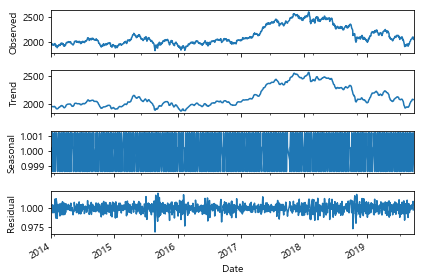

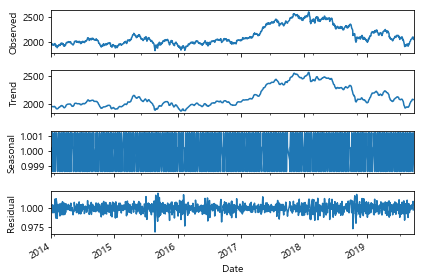

In [31]:
res1 = seasonal_decompose(kospi['Close'],model = 'multiplicative', freq = 7)
res1.plot()

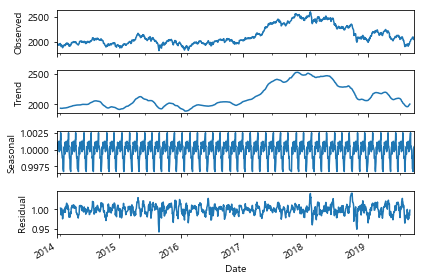

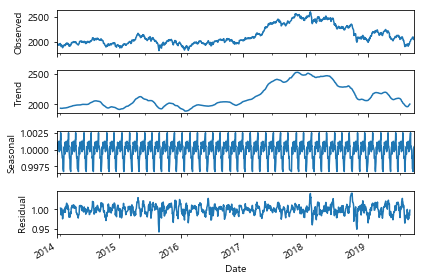

In [32]:
res2 = seasonal_decompose(kospi['Close'],model = 'multiplicative', freq = 30)
res2.plot()

In [33]:
train_core['high_low_ratio'] = train_core['High'] / train_core['Low']
train_core['open_close_ratio'] = train_core['Open'] / train_core['Close']

test_core['high_low_ratio'] = test_core['High'] / test_core['Low']
test_core['open_close_ratio'] = test_core['Open'] / test_core['Close']

## Time series decomposition의 결과와 연관시켜 월을 기준으로 개별 종목의 종가에 대한 시각화
월을 기준으로 plotting을 하면 개별적인 종목들의 편차가 존재함을 확인할 수 있다. 

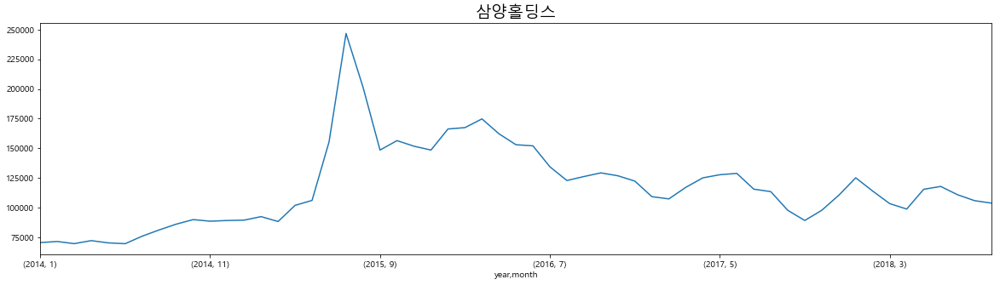

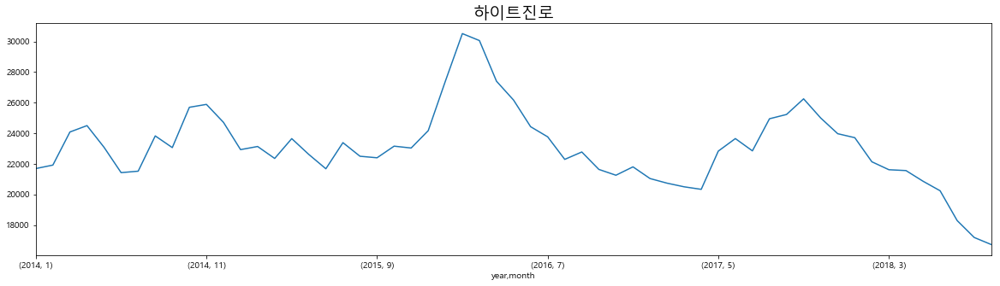

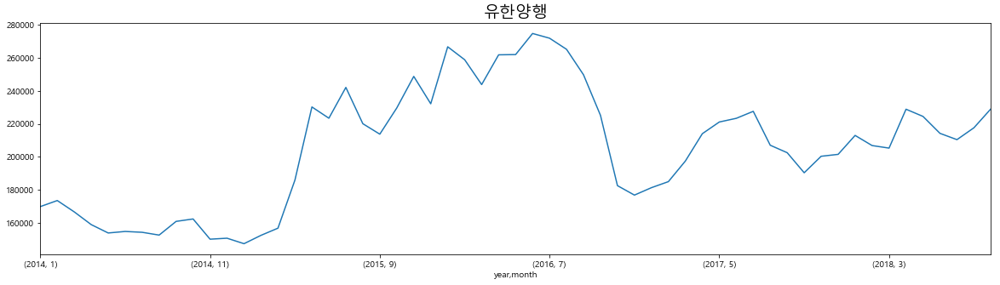

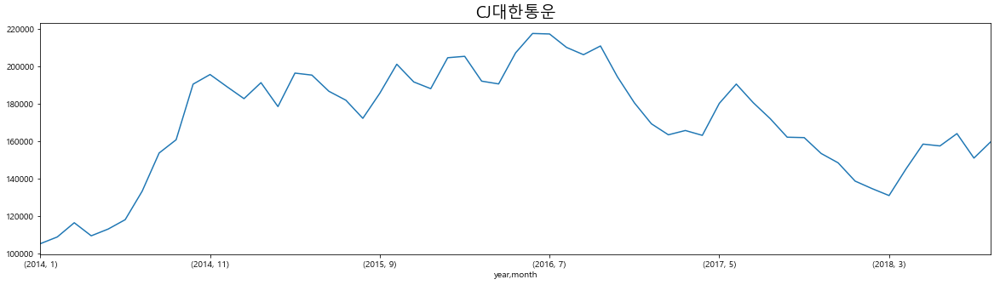

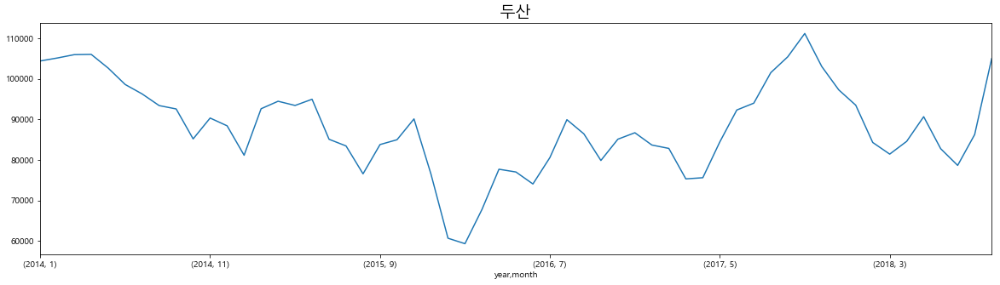

...

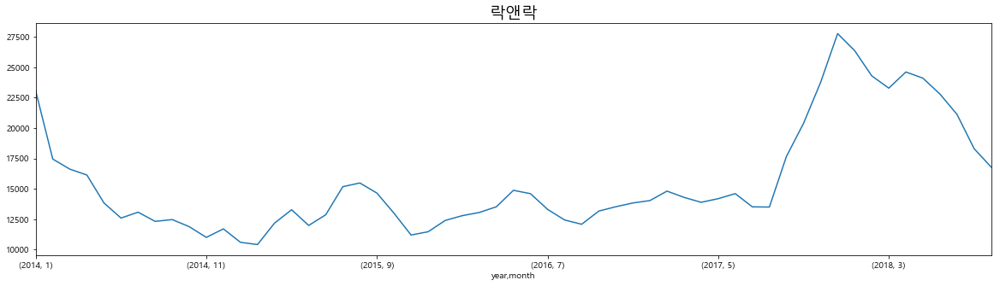

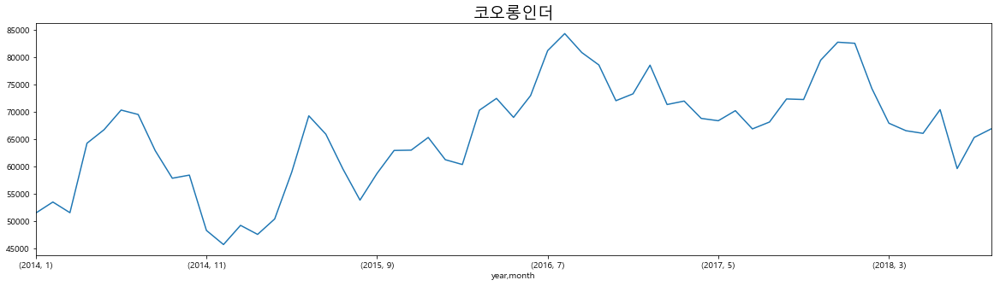

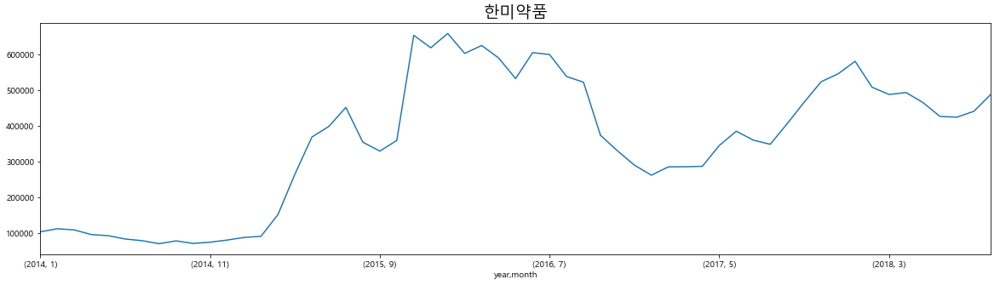

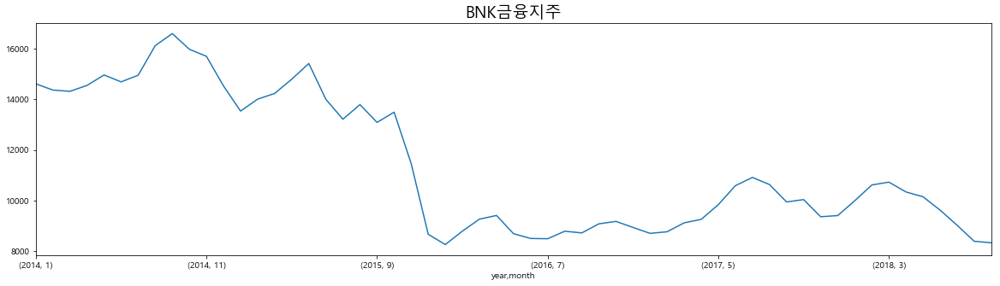

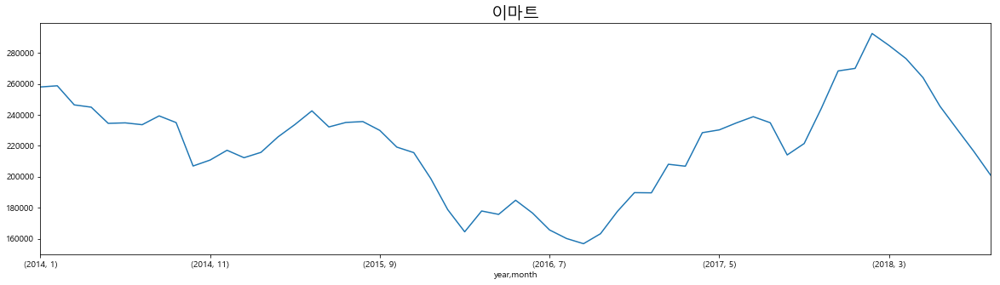

In [34]:
for i in np.unique(train_core['Symbol']):
    p1 = train_core[train_core['Symbol'] == i]
  #  p2 = p1.loc[:,['Close','Change','Symbol','Name']]
    plt.figure(figsize = (20,5))
    plt.title(np.unique(p1['Name'])[0],size = 19)
    p1.groupby(['year','month'])['Close'].mean().plot.line(subplots = True)

## Non Contextual time series Classification

- Process 1)개별 종목의 instance들만 불러 온다
- Process 2)일별 종가와 일별 변화양에 대하여 Normalization을 진행
- Process 3)전처리된 두 가지 값에 대한 분포를 시각화 한후 정규성 체크
- Process 4)정규성 체크 기준 
    - 4-1) qqplot
    - 4-2) skewness
        - If the skewness is between -0.5 and 0.5, the data are fairly symmetrical
        - If the skewness is between -1 and – 0.5 or between 0.5 and 1, the data are moderately skewed
        - If the skewness is less than -1 or greater than 1, the data are highly skewed
 
    - 4-3) kurtosis
        -   If the kurtosis is close to 0, then a normal distribution is often assumed.  These are called mesokurtic distributions.  
        - If the kurtosis is less than zero, then the distribution is light tails and is called a platykurtic distribution.  
        - If the kurtosis is greater than zero, then the distribution has heavier tails and is called a leptokurtic distribution.

C:\Users\lions\Anaconda3\lib\site-packages\matplotlib\legend.py:497: UserWarning:

Unrecognized location "upper_right". Falling back on "best"; valid locations are
	best
	upper right
	upper left
	lower left
	lower right
	right
	center left
	center right
	lower center
	upper center
	center


C:\Users\lions\Anaconda3\lib\site-packages\matplotlib\legend.py:497: UserWarning:

Unrecognized location "upper_right". Falling back on "best"; valid locations are
	best
	upper right
	upper left
	lower left
	lower right
	right
	center left
	center right
	lower center
	upper center
	center


C:\Users\lions\Anaconda3\lib\site-packages\matplotlib\legend.py:497: UserWarning:

Unrecognized location "upper_right". Falling back on "best"; valid locations are
	best
	upper right
	upper left
	lower left
	lower right
	right
	center left
	center right
	lower center
	upper center
	center


C:\Users\lions\Anaconda3\lib\site-packages\matplotlib\legend.py:497: UserWarning:

Unrecognized location "upper_right". Fall

C:\Users\lions\Anaconda3\lib\site-packages\matplotlib\legend.py:497: UserWarning:

Unrecognized location "upper_right". Falling back on "best"; valid locations are
	best
	upper right
	upper left
	lower left
	lower right
	right
	center left
	center right
	lower center
	upper center
	center


C:\Users\lions\Anaconda3\lib\site-packages\matplotlib\legend.py:497: UserWarning:

Unrecognized location "upper_right". Falling back on "best"; valid locations are
	best
	upper right
	upper left
	lower left
	lower right
	right
	center left
	center right
	lower center
	upper center
	center


C:\Users\lions\Anaconda3\lib\site-packages\matplotlib\legend.py:497: UserWarning:

Unrecognized location "upper_right". Falling back on "best"; valid locations are
	best
	upper right
	upper left
	lower left
	lower right
	right
	center left
	center right
	lower center
	upper center
	center


C:\Users\lions\Anaconda3\lib\site-packages\matplotlib\legend.py:497: UserWarning:

Unrecognized location "upper_right". Fall

C:\Users\lions\Anaconda3\lib\site-packages\matplotlib\legend.py:497: UserWarning:

Unrecognized location "upper_right". Falling back on "best"; valid locations are
	best
	upper right
	upper left
	lower left
	lower right
	right
	center left
	center right
	lower center
	upper center
	center


C:\Users\lions\Anaconda3\lib\site-packages\matplotlib\legend.py:497: UserWarning:

Unrecognized location "upper_right". Falling back on "best"; valid locations are
	best
	upper right
	upper left
	lower left
	lower right
	right
	center left
	center right
	lower center
	upper center
	center


C:\Users\lions\Anaconda3\lib\site-packages\matplotlib\legend.py:497: UserWarning:

Unrecognized location "upper_right". Falling back on "best"; valid locations are
	best
	upper right
	upper left
	lower left
	lower right
	right
	center left
	center right
	lower center
	upper center
	center


C:\Users\lions\Anaconda3\lib\site-packages\matplotlib\legend.py:497: UserWarning:

Unrecognized location "upper_right". Fall

C:\Users\lions\Anaconda3\lib\site-packages\matplotlib\legend.py:497: UserWarning:

Unrecognized location "upper_right". Falling back on "best"; valid locations are
	best
	upper right
	upper left
	lower left
	lower right
	right
	center left
	center right
	lower center
	upper center
	center


C:\Users\lions\Anaconda3\lib\site-packages\matplotlib\legend.py:497: UserWarning:

Unrecognized location "upper_right". Falling back on "best"; valid locations are
	best
	upper right
	upper left
	lower left
	lower right
	right
	center left
	center right
	lower center
	upper center
	center


C:\Users\lions\Anaconda3\lib\site-packages\matplotlib\legend.py:497: UserWarning:

Unrecognized location "upper_right". Falling back on "best"; valid locations are
	best
	upper right
	upper left
	lower left
	lower right
	right
	center left
	center right
	lower center
	upper center
	center


C:\Users\lions\Anaconda3\lib\site-packages\matplotlib\legend.py:497: UserWarning:

Unrecognized location "upper_right". Fall

C:\Users\lions\Anaconda3\lib\site-packages\matplotlib\legend.py:497: UserWarning:

Unrecognized location "upper_right". Falling back on "best"; valid locations are
	best
	upper right
	upper left
	lower left
	lower right
	right
	center left
	center right
	lower center
	upper center
	center


C:\Users\lions\Anaconda3\lib\site-packages\matplotlib\legend.py:497: UserWarning:

Unrecognized location "upper_right". Falling back on "best"; valid locations are
	best
	upper right
	upper left
	lower left
	lower right
	right
	center left
	center right
	lower center
	upper center
	center


C:\Users\lions\Anaconda3\lib\site-packages\matplotlib\legend.py:497: UserWarning:

Unrecognized location "upper_right". Falling back on "best"; valid locations are
	best
	upper right
	upper left
	lower left
	lower right
	right
	center left
	center right
	lower center
	upper center
	center


C:\Users\lions\Anaconda3\lib\site-packages\matplotlib\legend.py:497: UserWarning:

Unrecognized location "upper_right". Fall

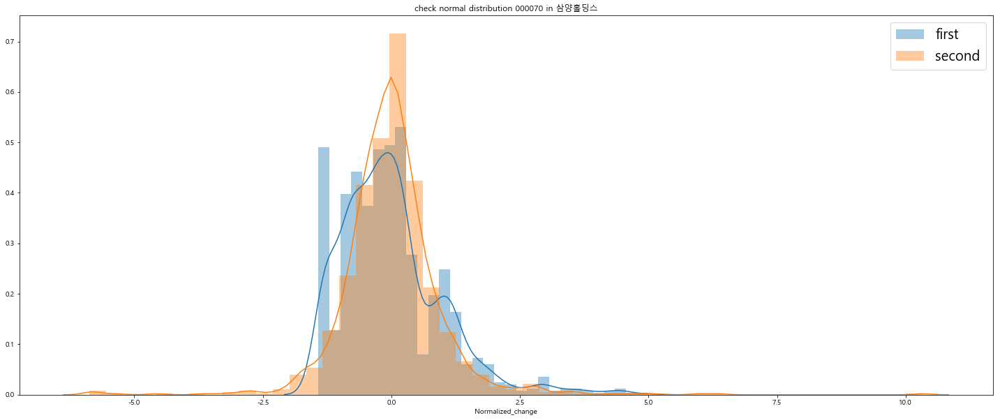

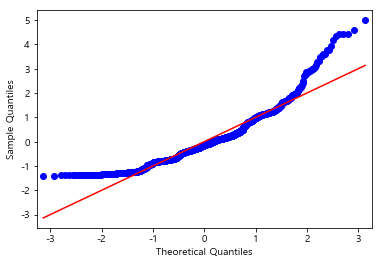

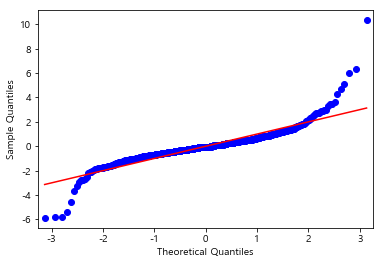

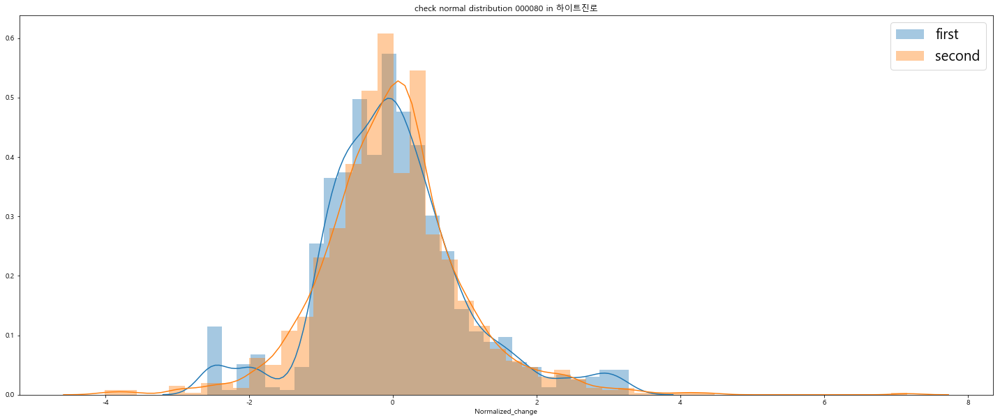

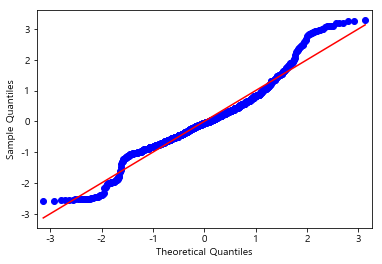

...

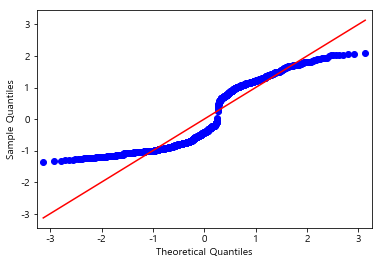

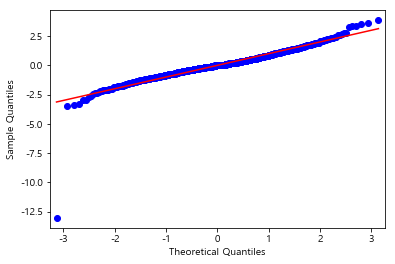

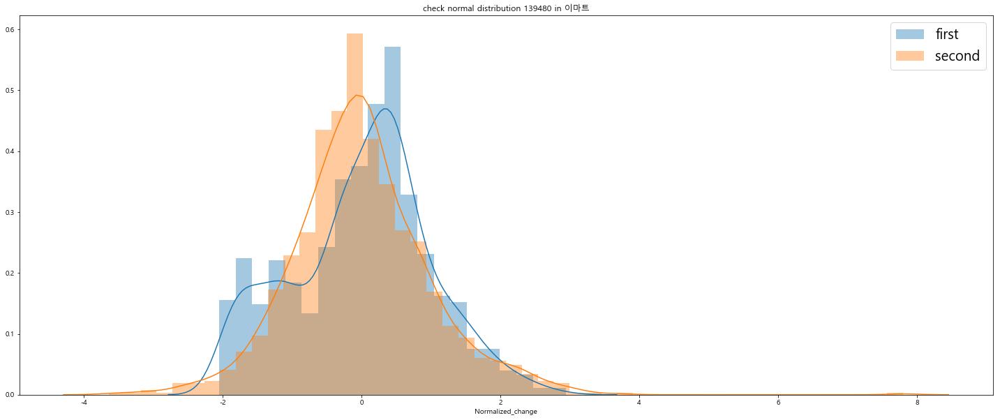

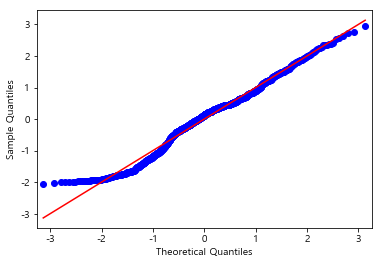

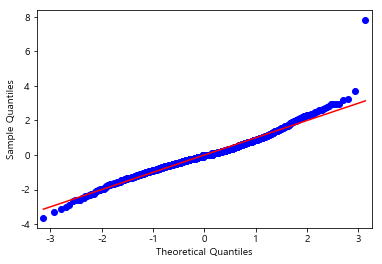

In [35]:
def visualize_dist(data):    
    for i in np.unique(data['Symbol']):
        p1 = data[data['Symbol'] == i]
        p2 = p1.loc[:,['Close','Change','Symbol','Name']]

        plt.figure(figsize = (25,10))

        p2['Normalized_close'] = (p2['Close'] - p2['Close'].mean()) / p2['Close'].std()
        p2['Normalized_change'] = (p2['Change'] - p2['Change'].mean()) / p2['Change'].std()

        sns.distplot(p2['Normalized_close'],label='first')
        sns.distplot(p2['Normalized_change'],label='second')
        plt.legend(loc = 'upper_right',fontsize = 20)
        plt.title('check normal distribution ' + i + ' in ' + np.unique(p2['Name'])[0])
        qqplot(p2['Normalized_close'],line = 's')
        qqplot(p2['Normalized_change'],line = 's')
        
visualize_dist(train_core)

### 다음과 같은 기준으로 정적인 개별 종목 분류를 할 수 있다.

|setting|Change Normality O|Change Normality X |
|------|---|---|
|Price Noramlity O|D2|D1|
|Price Noramlity X|D3|D4|

|criteria|kurtosis O|kurtosis X|
|------|---|---|
|symmetrical|DC1|DC2|
|moderately skewed|DC3|DC4|
|highly skewed|DC5|DC6|

개별 종목별 분포를 표현하는 평균값과 표준편차를 새로운 feature로 더한다.

In [36]:
# def give_value(data,cri1,cri2):
#     skew_bin, kurt_bin = [],[]
#     if (data[cri1][0] >= -0.5) & (data[cri1][0] <= 0.5):
#         skewness = 'symmetrical'
#         skew_bin.append(skewness)
#     elif ((abs(data[cri1][0]) > 0.5) & (abs(data[cri1][0]) <= 1.0)):
#         skewness = 'moderately skewed'
#         skew_bin.append(skewness)
#     else:
#         skewness = 'highly skewed'
#         skew_bin.append(skewness)
        
#     if ((data[cri2][0] >= -3.0) & (data[cri2][0] <= 3.0)):
#         kurtosis = 'oka'
#         kurt_bin.append(kurtosis)
#     else:
#         kurtosis = 'noka'
#         kurt_bin.append(kurtosis)
#     return skew_bin,kurt_bin

In [37]:
# def non_context_classification(data):
    
#     D1,D2,D3,D4 = [],[],[],[]

#     for i in np.unique(data['Symbol']):
#         p1 = data[data['Symbol'] == i]
#         p2 = p1.loc[:,['Close','Change','Symbol','Name','Code']]

#         close_mean = p2['Close'].mean()
#         close_std = p2['Close'].std()
#         change_mean = p2['Change'].mean()
#         change_std = p2['Change'].std()   

#         p2['Normalized_close'] = (p2['Close'] - p2['Close'].mean()) / p2['Close'].std()
#         p2['Normalized_change'] = (p2['Change'] - p2['Change'].mean()) / p2['Change'].std()

#         p2['normalized_close_skew'] = skew(p2['Normalized_close'])
#         p2['normalized_close_kurtosis'] = kurtosis(p2['Normalized_close'])

#         p2['normalized_change_skew'] = skew(p2['Normalized_change'])
#         p2['normalized_change_kurtosis'] = kurtosis(p2['Normalized_change'])
        
        
        
        
#        a1,b1 = give_value(p2,'normalized_close_skew','normalized_close_kurtosis')
#        a2,b2 = give_value(p2,'normalized_change_skew','normalized_change_kurtosis')

#         if (a1 == 'symmetrical') & (b1 == 'oka'):
#             close_fitting = 'dc1'
#         elif (a1 == 'symmetrical') & (b1 == 'noka'):
#             close_fitting = 'dc2'
#         elif (a1 == 'moderately skewed') & (b1 == 'oka'):
#             close_fitting = 'dc3'
#         elif (a1 == 'moderately skewed') & (b1 == 'noka'):
#             close_fitting = 'dc4'
#         elif (a1 == 'highly skewed') & (b1 == 'oka'):
#             close_fitting = 'dc5'
#         else:
#         #elif (a1 == 'highly skewed') & (b1 == 'noka'):
#             close_fitting = 'dc6'
        
#         if close_fitting in ['dc1','dc2','dc3']:
#             fi_close = 'normal'
#         else:
#             fi_close = 'non_normal'
        
#         if (a2 == 'symmetrical')  & (b2 == 'oka'):
#             change_fitting = 'dc1'
#         elif (a2 == 'symmetrical') & (b2 == 'noka'):
#             change_fitting = 'dc2'
#         elif (a2 == 'moderately skewed') & (b2 == 'oka'):
#             change_fitting = 'dc3'
#         elif (a2 == 'moderately skewed') & (b2 == 'noka'):
#             change_fitting = 'dc4'
#         elif (a2 == 'highly skewed') & (b2 == 'oka'):
#             change_fitting = 'dc5'
#         #elif (a2 == 'highly skewed') & (b2 == 'noka'):
#         else:
#             change_fitting = 'dc6'
        
#         if change_fitting in ['dc1','dc2','dc3']:
#             fi_change = 'normal'
#         else:
#             fi_change = 'non_normal'
            
#         if (fi_close == 'normal') & (fi_change == 'normal'):
#             final_value = 'D2'
#         elif (fi_close == 'normal') & (fi_change == 'non_normal'):
#             final_value = 'D1'
#         elif (fi_close == 'non_normal') & (fi_change == 'normal'):
#             final_value = 'D3'
#         elif (fi_close == 'non_normal') & (fi_change == 'non_normal'):
#             final_value = 'D4'
        
#         if final_value == 'D1':
#             D1.append(np.unique(p2['Symbol']))
#         elif final_value == 'D2':
#             D2.append(np.unique(p2['Symbol']))
#         elif final_value == 'D3':
#             D3.append(np.unique(p2['Symbol']))
#         elif final_value == 'D4':
#             D4.append(np.unique(p2['Symbol']))
#         return D1,D2,D3,D4

## First Clustering

In [38]:
def generate_feature(data):  
    t1 = pd.DataFrame(data.groupby(['Symbol'])['Close'].mean())
    t1['Symbol'] = t1.index
    t1 = t1.rename(columns = {'Close' : 'Close_mean'})
    t1 = t1.reset_index(drop=True)

    t2 = pd.DataFrame(data.groupby(['Symbol'])['Close'].std())
    t2['Symbol'] = t2.index
    t2 = t2.rename(columns = {'Close' : 'Close_std'})
    t2 = t2.reset_index(drop=True)

    t3 = pd.DataFrame(data.groupby(['Symbol'])['Change'].mean())
    t3['Symbol'] = t3.index
    t3 = t3.rename(columns = {'Change' : 'Change_mean'})
    t3 = t3.reset_index(drop=True)

    t4 = pd.DataFrame(data.groupby(['Symbol'])['Change'].std())
    t4['Symbol'] = t4.index
    t4 = t4.rename(columns = {'Change' : 'Change_std'})
    t4 = t4.reset_index(drop=True)

    t5 = pd.DataFrame(data.groupby(['Symbol'])['high_low_ratio'].mean())
    t5['Symbol'] = t5.index
    t5 = t5.rename(columns = {'high_low_ratio' : 'high_low_ratio_mean'})
    t5 = t5.reset_index(drop=True)

    t6 = pd.DataFrame(data.groupby(['Symbol'])['high_low_ratio'].std())
    t6['Symbol'] = t6.index
    t6 = t6.rename(columns = {'high_low_ratio' : 'high_low_ratio_std'})
    t6 = t6.reset_index(drop=True)

    t7 = pd.DataFrame(data.groupby(['Symbol'])['open_close_ratio'].mean())
    t7['Symbol'] = t5.index
    t7 = t5.rename(columns = {'open_close_ratio' : 'open_close_ratio_mean'})
    t7 = t5.reset_index(drop=True)

    t8 = pd.DataFrame(data.groupby(['Symbol'])['open_close_ratio'].std())
    t8['Symbol'] = t8.index
    t8 = t8.rename(columns = {'open_close_ratio' : 'open_close_ratio_std'})
    t8 = t8.reset_index(drop=True)

    s1 = pd.merge(t1,t2,how = 'inner')
    s2 = pd.merge(s1,t3,how='inner')
    s3 = pd.merge(s2,t4,how='inner')
    s4 = pd.merge(s3,t5,how='inner')
    s5 = pd.merge(s4,t6,how='inner')
    s6 = pd.merge(s5,t7,how='inner')
    s7 = pd.merge(s6,t8,how='inner')
    data = pd.merge(data,s7,how='inner')
    return data

In [39]:
train_core = generate_feature(train_core)

Standard Scaling 작업을 진행

Expectation-Maximization K-Means Algorithm
- 1) Guess Some cluster centers
- 2) Repeat until converged
    - 2-1) E-step : assign points to the nearest cluster center
    - 2-2) M-step : set the cluster centers to the mean
 

In [40]:
def set_clusters(data,length,seed):
    # Guess Some Cluster Centers
    rng = np.random.RandomState(seed)
    i = rng.permutation(data.shape[0])[:length]
    centers = data[i]
    
    while True:
        # Assign points to the nearest cluster center
        labels = pairwise_distances_argmin(data,centers)
        
        # Set the cluster centers to the mean
        new_centers = np.array([data[labels == i].mean(0) for i in range(length)])
        
        if np.all(centers == new_centers):
            break
        centers = new_centers
    return centers,labels

In [41]:
def preprocess_and_clustering(data,k,seed):
    first_source = data.loc[:,['Symbol','Name','Close_mean','Close_std',
                               'Change_mean','Change_std','high_low_ratio_mean',
                                'high_low_ratio_std',
                                 'open_close_ratio_std']]
    # train set length : 1164 
    # test set length : 246
    
    if data.groupby(['Symbol']).size()[0] == 246:
        le = 246
    else:
        le = 1164

    first_source = first_source[::le] 
    first_source_normal = first_source.iloc[:,2:]
    scaler = StandardScaler()
    scaler.fit(first_source_normal)
    scaled = scaler.transform(first_source_normal)
    
    centers, labels = set_clusters(scaled,k,seed)
    return centers,labels

In [42]:
centers,labels = preprocess_and_clustering(train_core,20,2019)

Clustering에 따른 label값들의 분포를 살펴보면 다음과 같다.

In [43]:
a1,a2 = zip(*Counter(labels).items())
b1 = np.array(a1)
b2 = np.array(a2)

df = pd.DataFrame({'class':a1,'length':a2})

fig = go.Figure()

fig.add_trace(
    go.Bar(
        x = df['class'],
        y = df['length']
    ))

iplot(fig)

testset도 진행

In [44]:
test_core = generate_feature(test_core)

In [45]:
centers,labels = preprocess_and_clustering(test_core,20,2019)

In [46]:
a1,a2 = zip(*Counter(labels).items())
b1 = np.array(a1)
b2 = np.array(a2)

df = pd.DataFrame({'class':a1,'length':a2})

fig = go.Figure()

fig.add_trace(
    go.Bar(
        x = df['class'],
        y = df['length']
    ))

iplot(fig)

# Contextual Time series Classification

- trainset time lengths : 1164
- testset time lengths : 246

## Process

- Step1 : Set window and segment size
- Step2 : Normalize the windows
- Step3 : Contextual clustering
- Step4 : Reconstruction Time

In [47]:
tr_len = len(np.unique(train_core['Symbol'])) # 143
data_length = 1164
segment_len = 30
slide_len = 2
X = Symbol('x')
equation = slide_len * (X-1) + segment_len - data_length
y_s = solve(equation)[0]
#tr_null = [[] for i in repeat(None,)]
tr_null = []

for i in np.unique(train_core['Symbol']):
    #total_segments = [[] for i in repeat(None,len(np.unique(train_core['Symbol'])))]
    
    p1 = train_core[train_core['Symbol'] == i]['Close']
    
    #f_len = tr_len // segment_len
    segments = [[] for i in repeat(None,y_s)]
    
    for start_pos in range(0,len(p1),slide_len):
        end_pos = start_pos + segment_len
        segment = np.copy(p1[start_pos:end_pos])
        # if we're at the end and we've got a truncated segment, drop it
        if len(segment) != segment_len:
            continue
        segments[int(start_pos // slide_len)] = segment
    
    window_rads = np.linspace(0, np.pi,segment_len)
    window = np.sin(window_rads)**2
    windowed_segments = []
    for segment in segments:
        windowed_segment = np.copy(segment) * window
        windowed_segments.append(windowed_segment)
    tr_null.append(windowed_segments)

In [49]:
p1 = []
for a in tr_null:
    Cluster = KMeans(n_clusters = 150)
    Cluster.fit(a)
    assignments = Cluster.labels_
    p1.append(assignments)

In [50]:
p1

[array([  7,   7,   7,   7,  83,  83,  83,  83,  83,  83,  83,  83,  83,
         83,  83,   7,   7,   7,   7,   7,   7,   7,  83,  83,  83,  83,
         83,  83,  83,  83,  83,  83,  83,  83,  83,   7,   7,   7,   7,
          7,   7,  83,  83,  83,  83,  83,   7,   7,   7,   7,   7,   7,
          7,  83,  83,  83,  27,  27,  27,  27,  27,  27,  27,  27,  27,
         27,  27,  27,  27,  96,  96,  96,  96,  96,  96,  96,  96,  96,
         96,  59,  59,  59,  18,  18, 149,  18,  18, 149, 149, 149, 149,
        149, 149, 149, 149, 149, 149,   1,   1,  59,  59,  18,  18, 149,
        149, 149,  18,  18, 149, 149, 149, 149, 149,  18,  18, 149, 149,
        149,  18,  18,  18,  18,  18, 139, 139, 139,  72,  72,  72,  72,
         72,  72, 149, 149, 149,   1,   1,   1,  59,  59,  59,  59, 139,
        139,  72,  72,  35,  35,  92,  52, 103, 126, 125, 118, 113,  48,
         79,  79,  79,  22,  22,  79, 124, 124, 124,  51,  80,  43,  36,
          9,  32,  31,  11,  23,  46,  40,   8,  33

# To do list

## Find other time series clustering method and apply
## Consensus Clustering